In [590]:
using Plots

In [591]:
function find_max(f, tri)
    max_i = 1
    for i ∈ 2:3
        if f(tri[i]...) >= f(tri[max_i]...)
            max_i = i
        end
    end
    return max_i
end
function find_min(f, tri)
    max_i = 1
    for i ∈ 2:3
        if f(tri[i]...) <= f(tri[max_i]...)
            max_i = i
        end
    end
    return max_i
end
function cast(start, tri)
    new_tri = []
    for i ∈ 1:3
        push!(new_tri, tri[start]+0.5*(tri[i]-tri[start]))
    end
    return new_tri
end
function norm(a)
    su = 0 
    for i ∈ a
        su += i^2
    end
    return su^(1/2)
end
function sss(f, start, eps)
    tri = [[0., 0.]+start, [(3^(1/3)+1)/(2*2^(1/2)), (3^(1/3)-1)/(2*2^(1/2))]+start, [(3^(1/3)-1)/(2*2^(1/2)), (3^(1/3)+1)/(2*2^(1/2))]+start]
    hist = []
    while true
        push!(hist, copy(tri))
        max_i = find_max(f, tri)
        sums = [0, 0]
        new_two = []
        for i ∈ 1:3
            if i != max_i
                sums += tri[i]
                push!(new_two, copy(tri[i]))
            else
                sums -= tri[i]
            end
        end
        new_tri = [sums, new_two...]
        if find_max(f, new_tri) == 1
            mi = find_min(f, tri)
            new_tri = cast(mi, tri)
            if norm(new_tri[1]-new_tri[2]) < eps
                return tri[mi], hist
            end
        end
        tri = new_tri
    end

end

sss (generic function with 1 method)

In [592]:
function NM(f, start, eps)
    tri = [[0., 0.]+start, [(3^(1/3)+1)/(2*2^(1/2)), (3^(1/3)-1)/(2*2^(1/2))]+start, [(3^(1/3)-1)/(2*2^(1/2)), (3^(1/3)+1)/(2*2^(1/2))]+start]
    hist = []
    while true
        push!(hist, copy(tri))
        max_i = find_max(f, tri)
        sums = [0, 0]
        new_two = []
        sumsof2 = [0, 0]
        for i ∈ 1:3
            if i != max_i
                sums += tri[i]
                push!(new_two, copy(tri[i]))
                sumsof2 += tri[i]

            else
                sums -= tri[i]
            end
        end
        sumsof2 *= 1/2
        new_tri = [sums, new_two...]
        if f(sums...) < f(tri[find_min(f, tri)]...)
            sums2 = 2*sums+(1-2)*sumsof2
            if f(sums2...) > f(new_tri[find_max(f, new_tri)]...) && f(sums2...) < f(tri[max_i]...)
                sums2 = 0.5*sums+(1-0.5)*sumsof2
            elseif f(sums2...) > f(sums...)
                sums2 = sums
            end
            new_tri = [sums2, new_two...]
        elseif f(sums...) > f(tri[max_i]...)
            mi = find_min(f, tri)
            new_tri = cast(mi, tri)
        end


        tri = new_tri
        mi = find_min(f, tri)
        sig = 0
        for i ∈ 1:3
            sig += (f(tri[i]...) - f(tri[mi]...))^2
        end
        sig = sig ^ (1/2)
        if sig < eps
            return tri[mi], hist
        end
    end

end

NM (generic function with 1 method)

In [593]:
function dfdx(f, x,y, h)
    return (f(x+h,y)-f(x-h,y))/(2*h)
end
function dfdy(f, x,y, h)
    return (f(x,y+h)-f(x,y-h))/(2*h)
end

function grad_d(f,start,alpha, eps, h)
    x_i = copy(start)
    hist = [copy(start)]
    while true
        grad = [dfdx(f, x_i..., h), dfdy(f, x_i..., h)]
        x_i1 = x_i-alpha*grad
        x_i = x_i1
        push!(hist, copy(x_i))
        if norm([dfdx(f, x_i..., h), dfdy(f, x_i..., h)]) < eps
            return x_i, hist
        end
    end
end

grad_d (generic function with 2 methods)

In [594]:
f(x, y) = (x^2+y^2)
banan(x, y) = 1*(x^2-y)^2+1*(x-1)^2+0

rastrigin(x, y) = 10 * 2 + x^2 - 10 * cos(2π * x) + y^2 - 10 * cos(2π * y)

schwefel(x, y) = 418.9829 * 2 - (x * sin(sqrt(abs(x))) + y * sin(sqrt(abs(y))))
xs1 = -10:1:10
ys1 = -10:1:10
xs2 = 410:1:430
ys2 = 410:1:430

410:1:430

42025


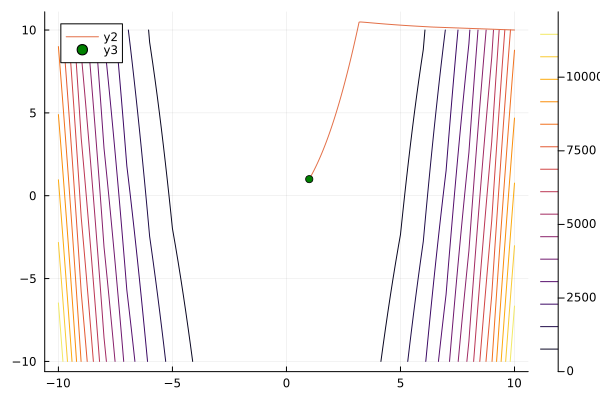

In [595]:
x_min, hist = grad_d(banan, [10., 10.], 0.001, 0.0001, 0.01)
println(length(hist))
contour(xs1, ys1, banan)
plot!([h[1] for h ∈ hist], [h[2] for h ∈ hist])
scatter!([x_min[1]], [x_min[2]], color=:green)

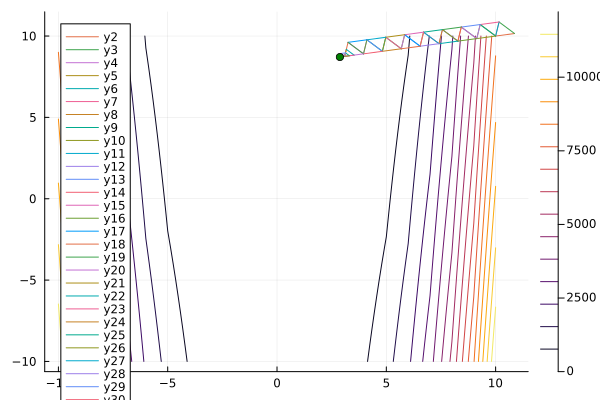

In [596]:

x_min, hist = sss(banan, [10., 10.], 0.1)
contour(xs1, ys1, banan)
for tri ∈ hist
    plot!([tri[1][1], tri[2][1]], [tri[1][2], tri[2][2]])
    plot!([tri[2][1], tri[3][1]], [tri[2][2], tri[3][2]])
    plot!([tri[3][1], tri[1][1]], [tri[3][2], tri[1][2]])
end
scatter!([x_min[1]], [x_min[2]], color=:green)

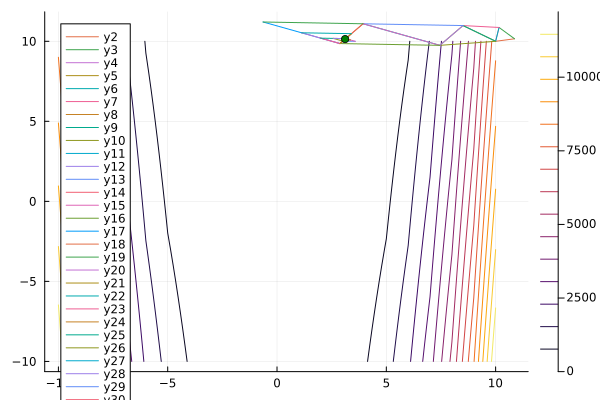

In [597]:
x_min, hist = NM(banan, [10., 10.], 0.01)
contour(xs1, ys1, banan)
for tri ∈ hist
    plot!([tri[1][1], tri[2][1]], [tri[1][2], tri[2][2]])
    plot!([tri[2][1], tri[3][1]], [tri[2][2], tri[3][2]])
    plot!([tri[3][1], tri[1][1]], [tri[3][2], tri[1][2]])
end
scatter!([x_min[1]], [x_min[2]], color=:green)

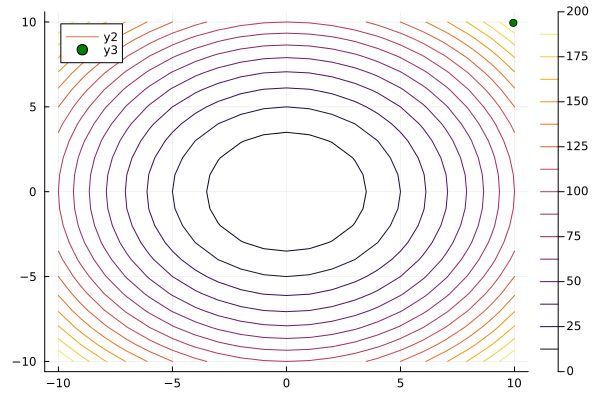

In [598]:
x_min, hist = grad_d(rastrigin, [10., 10.], 0.001, 0.001, 0.001)
contour(xs1, ys1, rastrigin)
plot!([h[1] for h ∈ hist], [h[2] for h ∈ hist])
scatter!([x_min[1]], [x_min[2]], color=:green)

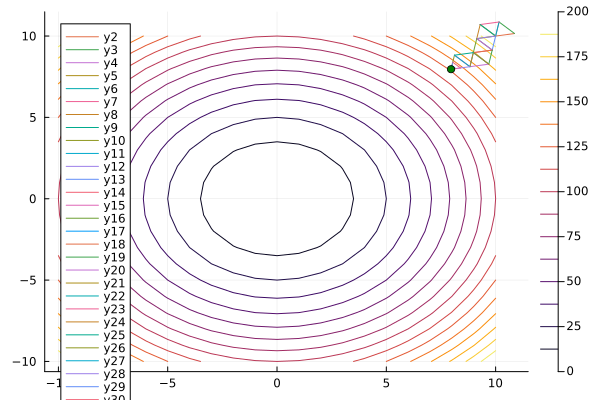

In [599]:
x_min, hist = sss(rastrigin, [10., 10.], 0.1)
contour(xs1, ys1, rastrigin)
for tri ∈ hist
    plot!([tri[1][1], tri[2][1]], [tri[1][2], tri[2][2]])
    plot!([tri[2][1], tri[3][1]], [tri[2][2], tri[3][2]])
    plot!([tri[3][1], tri[1][1]], [tri[3][2], tri[1][2]])
end
scatter!([x_min[1]], [x_min[2]], color=:green)

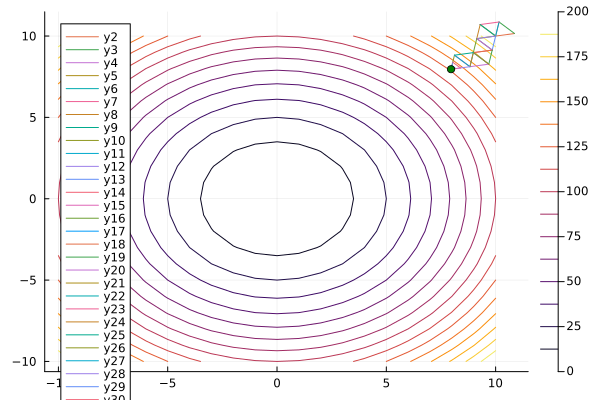

In [600]:
x_min, hist = NM(rastrigin, [10., 10.], 0.01)
contour(xs1, ys1, rastrigin)
for tri ∈ hist
    plot!([tri[1][1], tri[2][1]], [tri[1][2], tri[2][2]])
    plot!([tri[2][1], tri[3][1]], [tri[2][2], tri[3][2]])
    plot!([tri[3][1], tri[1][1]], [tri[3][2], tri[1][2]])
end
scatter!([x_min[1]], [x_min[2]], color=:green)

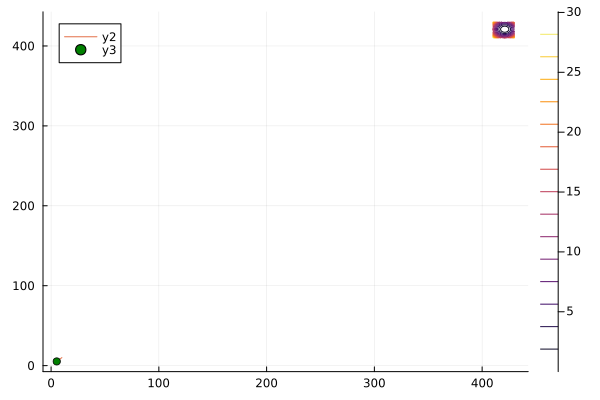

In [601]:
x_min, hist = grad_d(schwefel, [10., 10.], 0.0001, 0.0001, 0.01)
contour(xs2, ys2, schwefel)
plot!([h[1] for h ∈ hist], [h[2] for h ∈ hist])
scatter!([x_min[1]], [x_min[2]], color=:green)

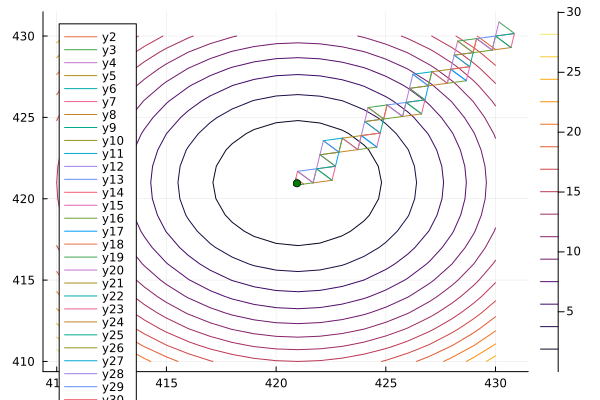

In [602]:
x_min, hist = sss(schwefel, [430.0,  430.0], 0.1)
contour(xs2, ys2, schwefel)
for tri ∈ hist
    plot!([tri[1][1], tri[2][1]], [tri[1][2], tri[2][2]])
    plot!([tri[2][1], tri[3][1]], [tri[2][2], tri[3][2]])
    plot!([tri[3][1], tri[1][1]], [tri[3][2], tri[1][2]])
end
scatter!([x_min[1]], [x_min[2]], color=:green)

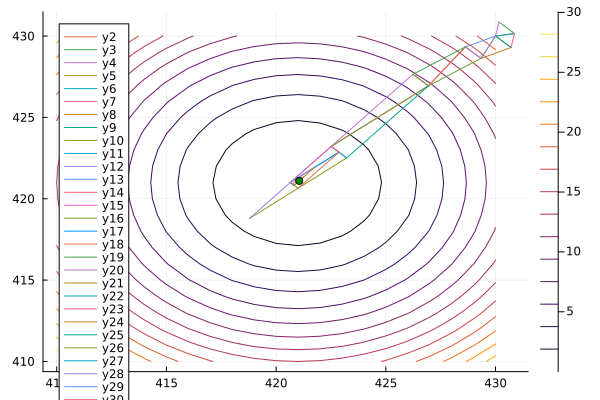

In [603]:

x_min, hist = NM(schwefel, [430.0,  430.0], 0.01)
contour(xs2, ys2, schwefel)
for tri ∈ hist
    plot!([tri[1][1], tri[2][1]], [tri[1][2], tri[2][2]])
    plot!([tri[2][1], tri[3][1]], [tri[2][2], tri[3][2]])
    plot!([tri[3][1], tri[1][1]], [tri[3][2], tri[1][2]])
end
scatter!([x_min[1]], [x_min[2]], color=:green)